<a href="https://colab.research.google.com/github/simonera/ua_python_intro/blob/main/03_2_IntroLowCodeEDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Low code Exploratory Data Tools
Created: 03/15/2023<br>
Updated: 03/17/2023

(**Must be executed again in Google Colab, to show all outputs**).

This Google Colab Jupyter Notebook shows EDA examples using a set of diverse low-code exploratory data tools:

* [ydata-profiling](https://github.com/ydataai/ydata-profiling), also known as `pandas-profiling`, the primary goal is to provide a one-line Exploratory Data Analysis (EDA) experience in a consistent and fast solution.
* [sweetviz](https://github.com/fbdesignpro/sweetviz). Sweetviz is an open-source Python library that generates beautiful, high-density visualizations to kickstart EDA (Exploratory Data Analysis) with just two lines of code. Output is a fully self-contained HTML application.
* [lux APLI](https://github.com/lux-org/lux). Lux is a Python library that facilitate fast and easy data exploration by automating the visualization and data analysis process. By simply printing out a dataframe in a Jupyter notebook, Lux recommends a set of visualizations highlighting interesting trends and patterns in the dataset.
* [DataPrep](https://github.com/sfu-db/dataprep). DataPrep.EDA is the fastest and the easiest EDA (Exploratory Data Analysis) tool in Python. It allows you to understand a Pandas/Dask DataFrame with a few lines of code in seconds.
* [AutoViz](https://github.com/AutoViML/AutoViz). AutoViz performs automatic visualization of any dataset with one line of code. Give it any input file (CSV, txt or json format) of any size and AutoViz will visualize it.


## ydata-profiling example.

In [6]:
!pip install tiktoken --quiet

In [7]:
!pip install openai --quiet

In [8]:
!pip install fastapi --quiet

In [9]:
!pip install cohere --quiet

In [10]:
!pip install uvicorn --quiet

In [11]:
!pip install kaleido --quiet

In [ ]:
#!pip install visions==0.7.4 --quiet

In [12]:
# pandas-profiling requirements

import sys
!{sys.executable} -m pip install -U ydata-profiling[notebook] --quiet
!jupyter nbextension enable --py widgetsnbextension


Enabling notebook extension jupyter-js-widgets/extension...
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json
Paths used for configuration of notebook: 
    	
      - Validating: OK
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json


In [13]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport


In [14]:
# Read Penguins dataset

pdataset = "https://raw.githubusercontent.com/clizarraga-UAD7/Datasets/main/penguins/penguins_size.csv"
df = pd.read_csv(pdataset)


In [15]:
# General dataframe info
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species            344 non-null    object 
 1   island             344 non-null    object 
 2   culmen_length_mm   342 non-null    float64
 3   culmen_depth_mm    342 non-null    float64
 4   flipper_length_mm  342 non-null    float64
 5   body_mass_g        342 non-null    float64
 6   sex                334 non-null    object 
dtypes: float64(4), object(3)
memory usage: 18.9+ KB


In [16]:
# Drop rows with missing numbers
df=df.dropna()
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 334 entries, 0 to 343
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species            334 non-null    object 
 1   island             334 non-null    object 
 2   culmen_length_mm   334 non-null    float64
 3   culmen_depth_mm    334 non-null    float64
 4   flipper_length_mm  334 non-null    float64
 5   body_mass_g        334 non-null    float64
 6   sex                334 non-null    object 
dtypes: float64(4), object(3)
memory usage: 20.9+ KB


In [17]:
# Pandas df.describe() summary
df.describe()


,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g
count,334.000000,334.000000,334.000000,334.000000
mean,43.994311,17.160479,201.014970,4209.056886
std,5.460521,1.967909,14.022175,804.836129
min,32.100000,13.100000,172.000000,2700.000000
25%,39.500000,15.600000,190.000000,3550.000000
50%,44.500000,17.300000,197.000000,4050.000000
75%,48.575000,18.700000,213.000000,4793.750000
max,59.600000,21.500000,231.000000,6300.000000


In [18]:
# To generate the standard profiling report

profile = ProfileReport(df, title="Profiling Report")


In [19]:
# displaying the report as a set of widgets

profile.to_widgets()


/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:522: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
# The HTML report can be directly embedded in a cell

profile.to_notebook_iframe()


Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Sweetviz example.

In [21]:
# Sweetviz install
!pip install sweetviz --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 41.2 MB/s eta 0:00:00


In [22]:
import sweetviz as sv

my_dataframe = df.copy()

my_report = sv.analyze(df)
my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


**Note**: Google Colab does not open HTML. Please download the HTML to your local computer and open it wiith a browser.


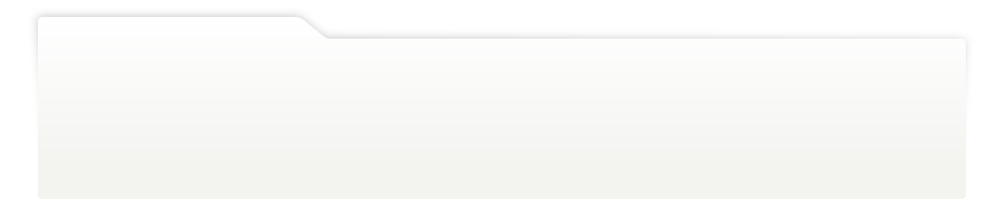
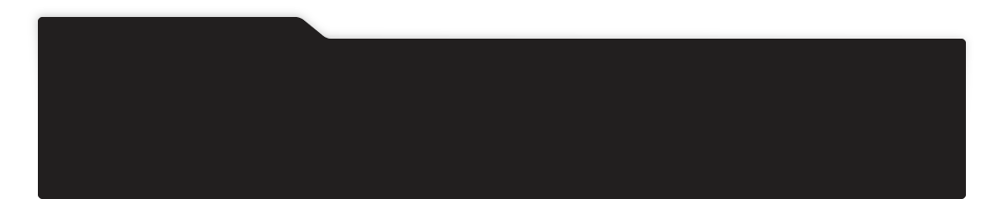
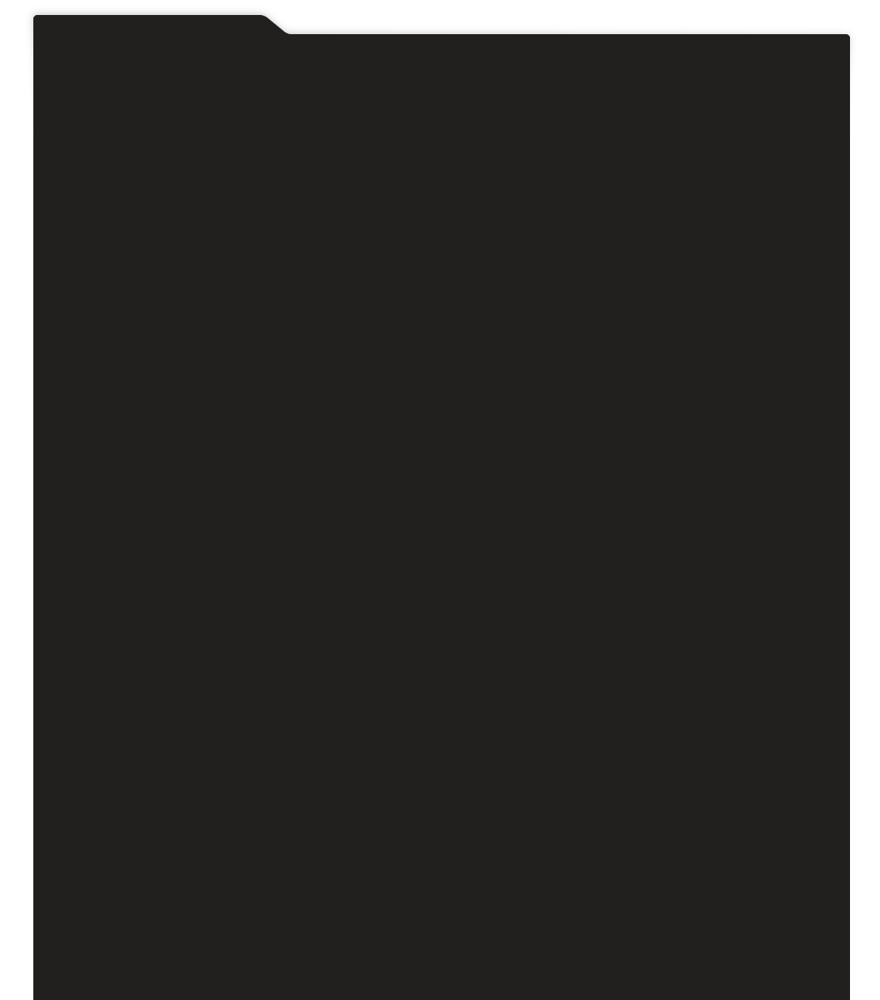
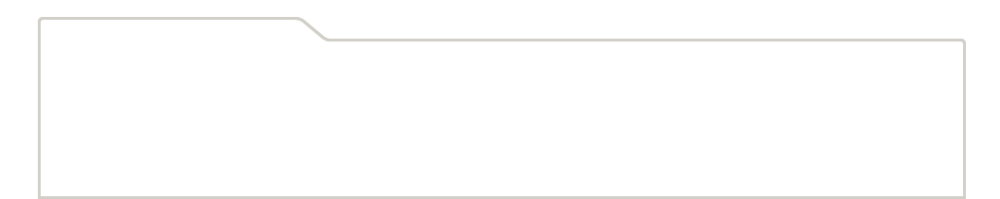
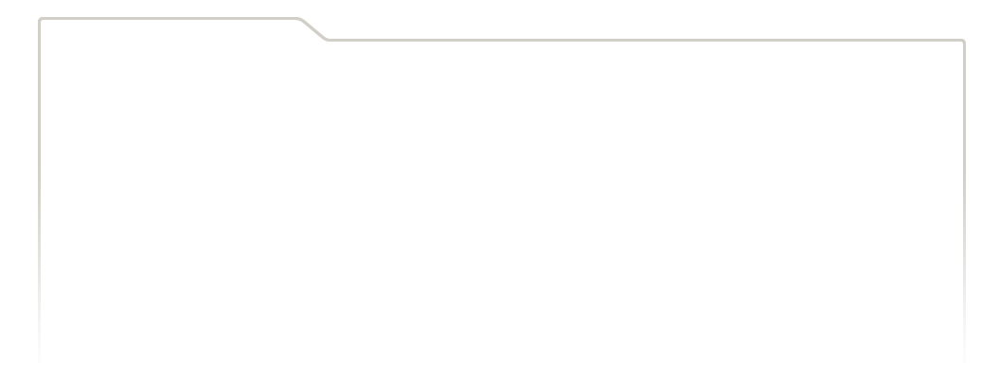
...
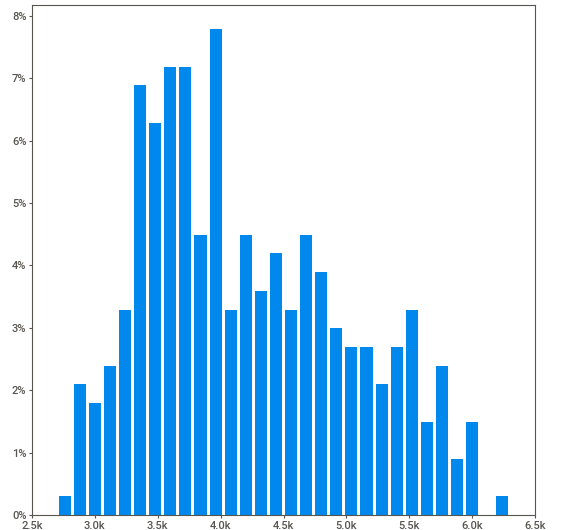
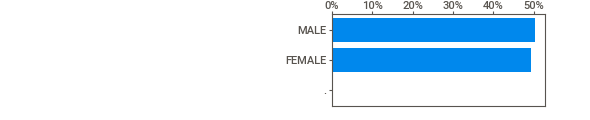
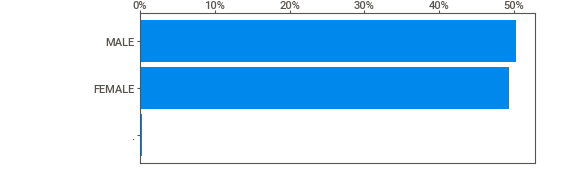
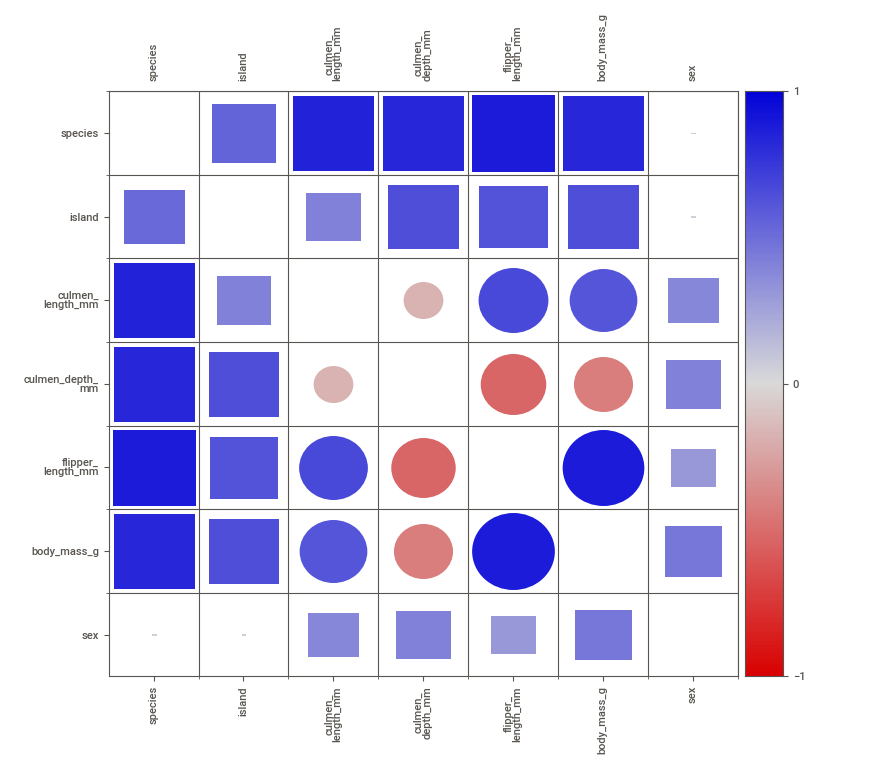
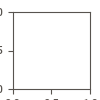

In [23]:
# To open results in notebook.
my_report.show_notebook()

## Lux API example.

In [24]:
# Lux installation

!pip install lux-api --quiet


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.0/127.0 kB 3.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 48.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.3/45.3 kB 5.2 MB/s eta 0:00:00


In [25]:
# Activate Jupyter notebook extension

!jupyter nbextension install --py luxwidget
!jupyter nbextension enable --py luxwidget


Installing /usr/local/lib/python3.10/dist-packages/luxwidget/nbextension/static -> luxwidget
Making directory: /usr/local/share/jupyter/nbextensions/luxwidget/
Copying: /usr/local/lib/python3.10/dist-packages/luxwidget/nbextension/static/extension.js -> /usr/local/share/jupyter/nbextensions/luxwidget/extension.js
Copying: /usr/local/lib/python3.10/dist-packages/luxwidget/nbextension/static/index.js.map -> /usr/local/share/jupyter/nbextensions/luxwidget/index.js.map
Copying: /usr/local/lib/python3.10/dist-packages/luxwidget/nbextension/static/index.js -> /usr/local/share/jupyter/nbextensions/luxwidget/index.js
- Validating: OK

    To initialize this nbextension in the browser every time the notebook (or other app) loads:
    
          jupyter nbextension enable luxwidget --py
    
Enabling notebook extension luxwidget/extension...
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json
Paths used for configuration of notebook: 
    	
      - Validating: O

In [26]:
# Load Lux and add local commands for Googe Colab

import lux
import pandas as pd

from google.colab import output
output.enable_custom_widget_manager()


In [27]:
# Read dataset

pdataset = "https://raw.githubusercontent.com/clizarraga-UAD7/Datasets/main/penguins/penguins_size.csv"
df = pd.read_csv(pdataset)

# Drop rows with missing numbers
df=df.dropna()


In [33]:
# Now print df and a Toggle widget will appear to switch between Pandas and Lux

df # click "Toggle Pandas/Lux" to see different stuff

Button(description='Toggle Pandas/Lux', layout=Layout(top='5px', width='140px'), style=ButtonStyle())

Output()

## DataPrep example

In [32]:
!pip install -U git+https://github.com/sfu-db/dataprep.git@develop --quiet # had some issues here

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [31]:
from dataprep.eda import *
from dataprep.eda import plot, plot_correlation, plot_missing, plot_diff, create_report

ModuleNotFoundError: No module named 'pydantic._internal'

In [ ]:
# Read dataset

pdataset = "https://raw.githubusercontent.com/clizarraga-UAD7/Datasets/main/penguins/penguins_size.csv"
df = pd.read_csv(pdataset)

# Drop rows with missing numbers
#df=df.dropna()

In [ ]:
plot(df)

In [ ]:
# Plot missing values

plot_missing(df)

In [ ]:
# Missing value overview

plot_missing(df, "sex")

In [ ]:
# Correlation overview

plot_correlation(df)

In [ ]:
# Understand how other columns correlated to the given column

plot_correlation(df, "body_mass_g")

In [ ]:
# Numerical column overview

plot(df, "body_mass_g")

In [ ]:
# Categorical value overview

plot(df, "sex")

In [ ]:
# Numerical vs. Numerical column relationship

plot(df, "flipper_length_mm", "body_mass_g")

In [ ]:
# Numerical vs. Categorical column relationship

plot(df, "body_mass_g", "sex")

In [ ]:
# Create a full report

create_report(df)

## AutoViz example

In [ ]:
# Install AutoViz

!pip install autoviz --quiet

In [ ]:
# Load AutoViz libraries

from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

# AutoViz does not display plots automatically. The next line is needed.
%matplotlib inline

In [ ]:
# Generate visualizations
pdataset = "https://raw.githubusercontent.com/clizarraga-UAD7/Datasets/main/penguins/penguins_size.csv"

AV.AutoViz(pdataset)
